# Project 1: Analysis and Forecasting of NYC Taxi Rides
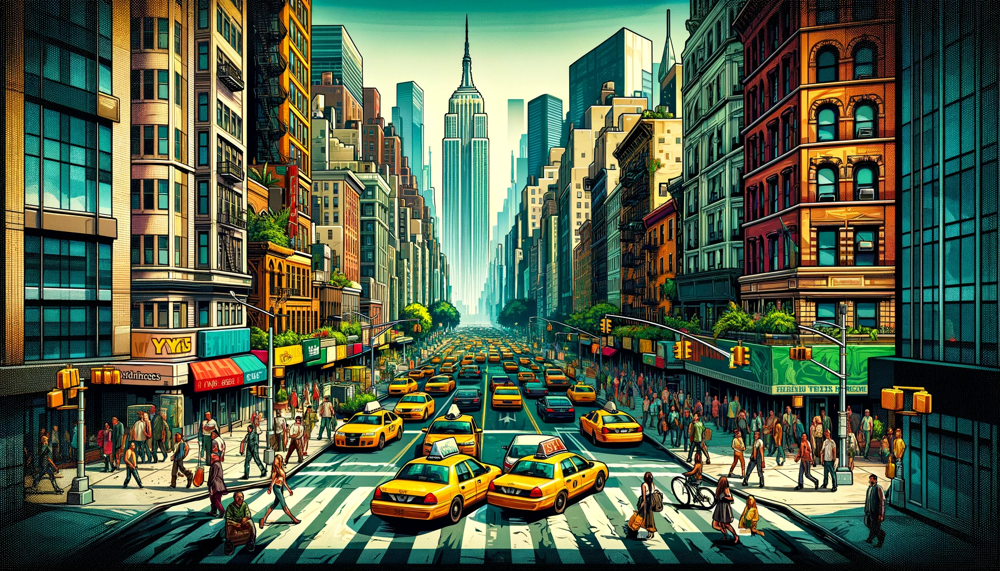

In [77]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the Data

Yellow and green taxi trip records include fields capturing 
- pick-up and drop-off dates/times
- pick-up and drop-off locations
- trip distances
- itemized fares
- rate types
- payment types
- driver-reported passenger counts 
  
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) by technology providers authorized under the Taxicab & Livery Passenger Enhancement Programs (TPEP/LPEP). The trip data was not created by the TLC, and TLC makes no representations as to the accuracy of these data.

**Remark**: Feel free to change the *months* and *year* in the code below, if you need more/less data. 

In [78]:
import pandas as pd
from src.utils import load_data_from_google_drive

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in
months = ['01', '02']
year = '2022'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [79]:
df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0


In [80]:
df_green.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.50,0.5,0.00,0.0,None,0.3,4.80,2.0,1.0,0.00
1,1,2022-01-01 00:20:55,2022-01-01 00:29:38,N,1.0,116,41,1.0,2.10,9.5,0.50,0.5,0.00,0.0,None,0.3,10.80,2.0,1.0,0.00
2,1,2022-01-01 00:57:02,2022-01-01 01:13:14,N,1.0,41,140,1.0,3.70,14.5,3.25,0.5,4.60,0.0,None,0.3,23.15,1.0,1.0,2.75
3,2,2022-01-01 00:07:42,2022-01-01 00:15:57,N,1.0,181,181,1.0,1.69,8.0,0.50,0.5,0.00,0.0,None,0.3,9.30,2.0,1.0,0.00
4,2,2022-01-01 00:07:50,2022-01-01 00:28:52,N,1.0,33,170,1.0,6.26,22.0,0.50,0.5,5.21,0.0,None,0.3,31.26,1.0,1.0,2.75


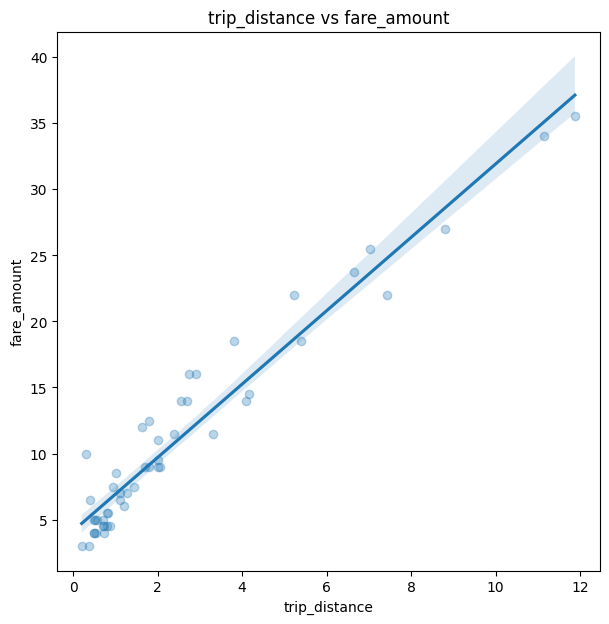

In [81]:
from src.utils import create_scatterplot

create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',
)

### Task 2: Exploratory Data Analysis
Conduct exploratory data analysis to understand the patterns and relationships in the data. This includes analyzing the distribution of trip distances, fares, and passenger counts, as well as the relationship between these variables.

Pay attention to the trip distance (and maybe also fare amount). Are there outliers? Should some data (that looks apparently not practical) be dropped?

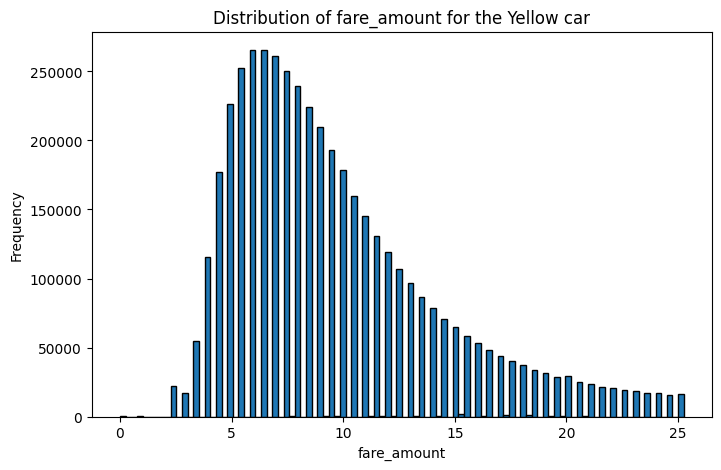

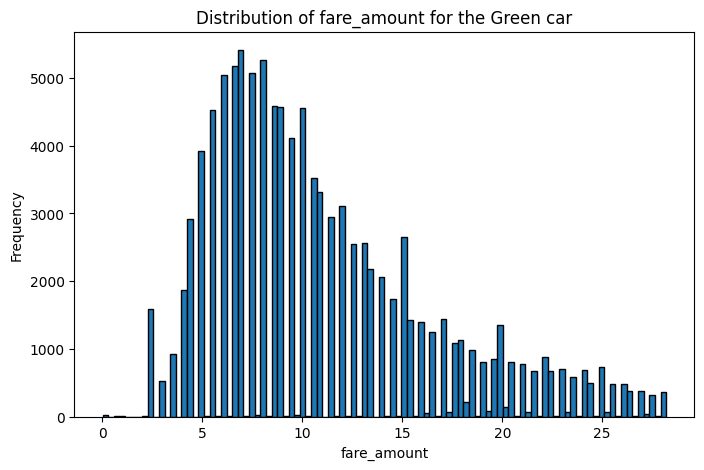

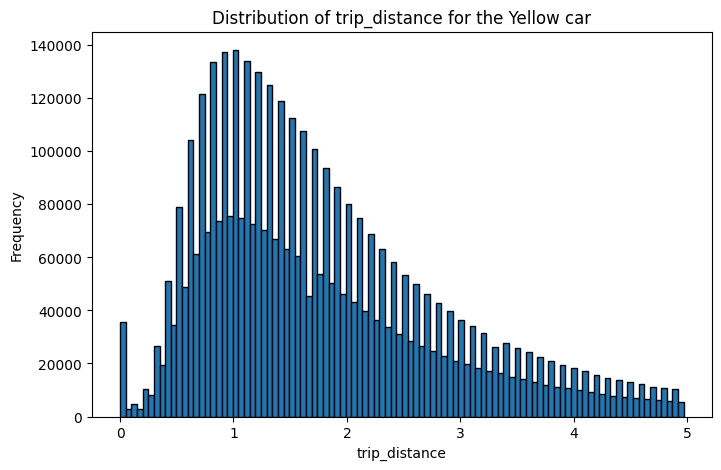

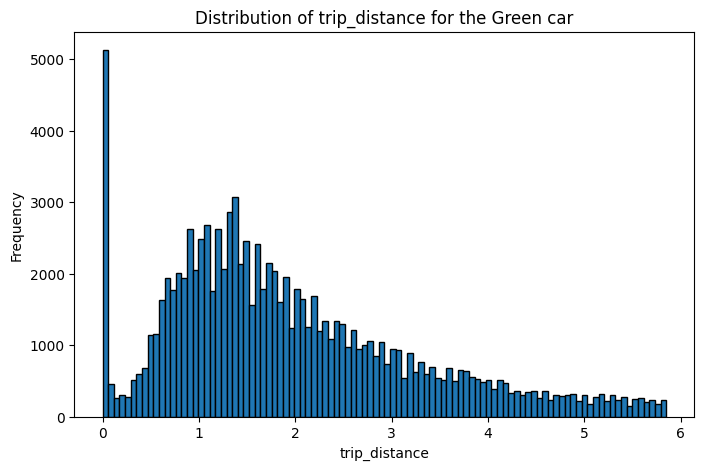

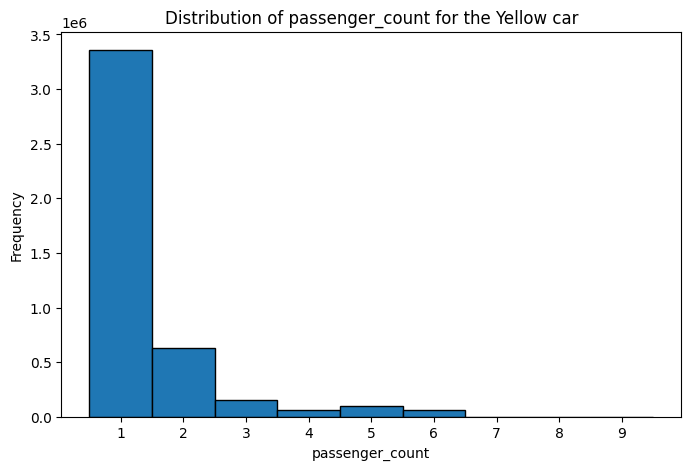

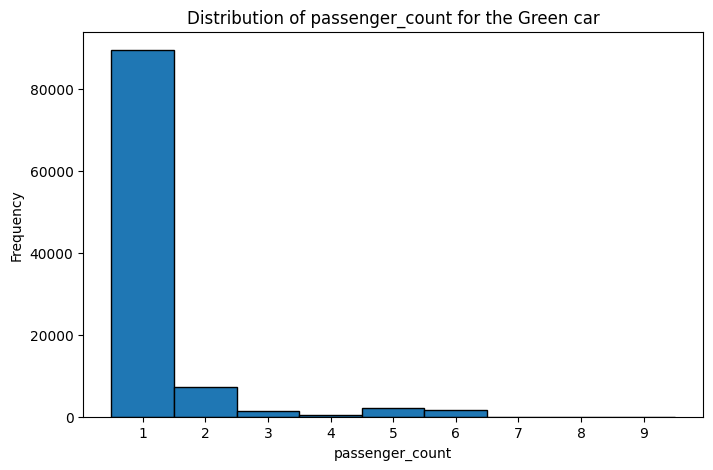

In [82]:
from  src.helper_functions import plot_histogram, filter_outliers, plot_scatter, sample_data_randomly, plot_violin
import matplotlib.pyplot as plt

# Remove rows where passenger_count or trip_distance is NaN or 0, negative and unrealisticly high fare amount, and reset index
df_yellow_cleaned = df_yellow.dropna(subset=['passenger_count', 'trip_distance', 'tpep_pickup_datetime', 'tpep_dropoff_datetime'])
df_yellow_cleaned = df_yellow_cleaned[
    (df_yellow_cleaned['passenger_count'] > 0)  
    # & (df_yellow_cleaned['trip_distance'] > 0.1)  # Ensure trip_distance is greater than 0.1
]
df_yellow_cleaned = df_yellow_cleaned[
    (df_yellow_cleaned['fare_amount'] > 0) 
    #& (df_yellow_cleaned['fare_amount'] <= 500)  # Remove fare_amount above $500
].reset_index(drop=True)

df_green_cleaned = df_green.dropna(subset=['passenger_count', 'trip_distance', 'lpep_pickup_datetime', 'lpep_dropoff_datetime'])
df_green_cleaned = df_green_cleaned[
    (df_green_cleaned['passenger_count'] > 0) 
    #& (df_green_cleaned['trip_distance'] > 0.1)  # Ensure trip_distance is greater than 0.1
]
df_green_cleaned = df_green_cleaned[
    (df_green_cleaned['fare_amount'] > 0) 
    #& (df_green_cleaned['fare_amount'] <= 500)  # Remove fare_amount above $500
].reset_index(drop=True)


df_yellow_cleaned = filter_outliers(df_yellow_cleaned, 'fare_amount')
plot_histogram(df_yellow_cleaned, 'fare_amount', 'Yellow')

df_green_cleaned = filter_outliers(df_green_cleaned, 'fare_amount')
plot_histogram(df_green_cleaned, 'fare_amount', 'Green')

df_yellow_cleaned = filter_outliers(df_yellow_cleaned, 'trip_distance')
plot_histogram(df_yellow_cleaned, 'trip_distance', 'Yellow')

df_green_cleaned = filter_outliers(df_green_cleaned, 'trip_distance')
plot_histogram(df_green_cleaned, 'trip_distance', 'Green')

## should only take whole numbers (1, 2, 3, 4, 5, 6), no need to clean outliers
#df_yellow_filtered_passengers = round((df_yellow_cleaned, 'passenger_count'),0)
plot_histogram(df_yellow_cleaned, 'passenger_count', 'Yellow')

#df_green_filtered_passengers = round((df_green_cleaned, 'passenger_count'),0)
plot_histogram(df_green_cleaned, 'passenger_count', 'Green')  

  


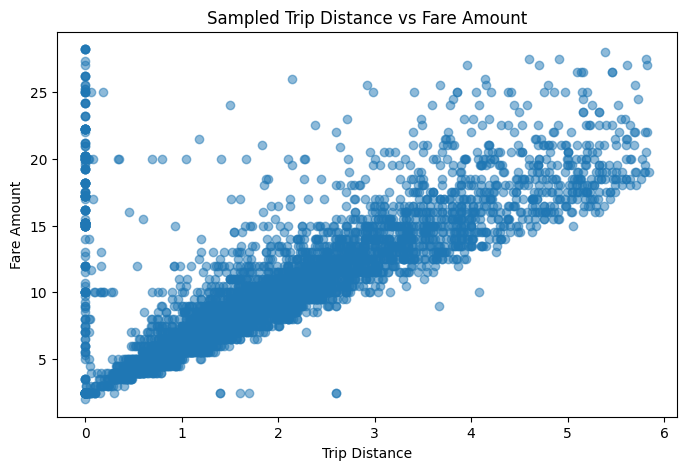

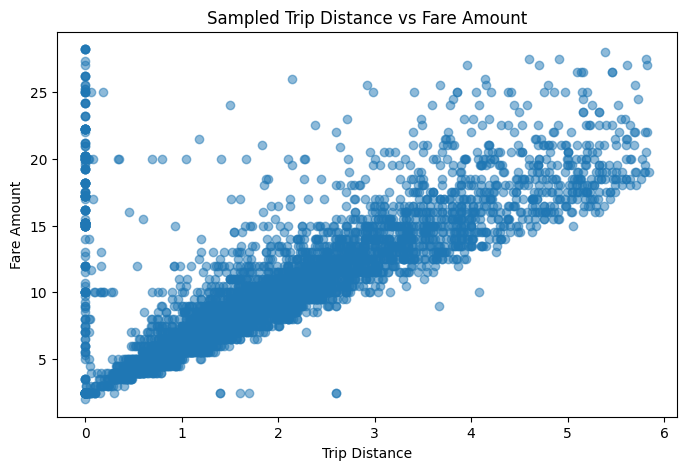

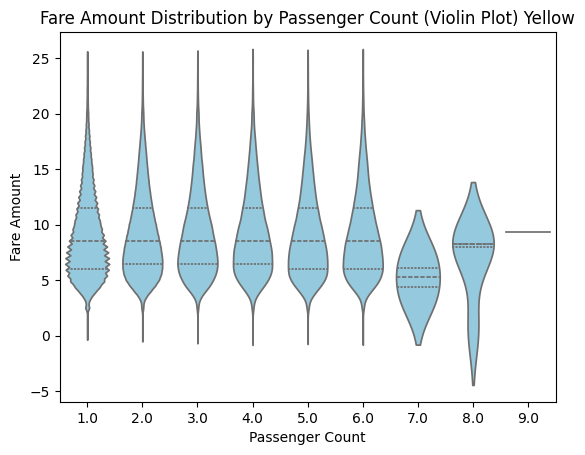

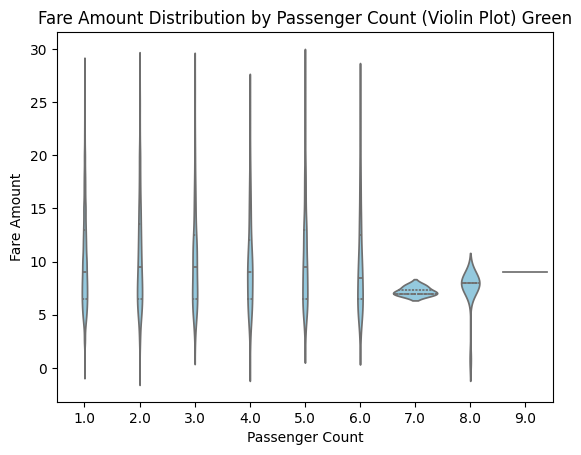

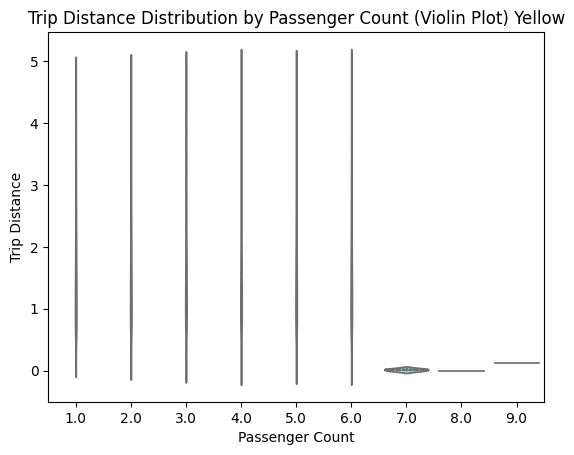

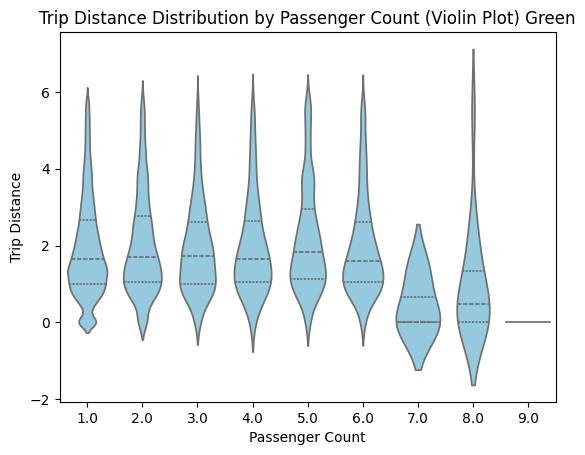

In [83]:
# Sample the data randomly to reduce scatter plot density
sampled_distance_yellow, sampled_fare_yellow = sample_data_randomly(df_yellow_cleaned, df_yellow_cleaned, sample_size=5000)
sampled_distance_green, sampled_fare_green = sample_data_randomly(df_green_cleaned, df_green_cleaned, sample_size=5000)

plot_scatter(sampled_distance_green,
             'trip_distance',
             sampled_fare_green,
             'fare_amount',
             'Sampled Trip Distance vs Fare Amount',
             'Trip Distance',
             'Fare Amount')

plot_scatter(sampled_distance_green, 'trip_distance'
             , sampled_fare_green
             , 'fare_amount'
             , title = 'Sampled Trip Distance vs Fare Amount'
             , xlabel = 'Trip Distance'
             , ylabel='Fare Amount')

plot_violin(
    df_yellow_cleaned, 
    x_col='passenger_count', 
    y_col='fare_amount', 
    title='Fare Amount Distribution by Passenger Count (Violin Plot) Yellow', 
    xlabel='Passenger Count', 
    ylabel='Fare Amount'
)

plot_violin(
    df_green_cleaned, 
    x_col='passenger_count', 
    y_col='fare_amount', 
    title='Fare Amount Distribution by Passenger Count (Violin Plot) Green', 
    xlabel='Passenger Count', 
    ylabel='Fare Amount'
)

plot_violin(
    df_yellow_cleaned, 
    x_col='passenger_count', 
    y_col='trip_distance', 
    title='Trip Distance Distribution by Passenger Count (Violin Plot) Yellow', 
    xlabel='Passenger Count', 
    ylabel='Trip Distance'
)

plot_violin(
    df_green_cleaned, 
    x_col='passenger_count', 
    y_col='trip_distance', 
    title='Trip Distance Distribution by Passenger Count (Violin Plot) Green', 
    xlabel='Passenger Count', 
    ylabel='Trip Distance'
)





**Textbook Practice**:
Apply the principle of "choosing an effective visual" in Chapter 2 to make the visualization. Explain how this principle is applied.

In [84]:
# Write your code and/or markdowns

### Task 3: Spatial Analysis
Use Kepler.gl (https://kepler.gl/) or similar tools/packages to visualize the spatial patterns of taxi rides. This includes the pickup and dropoff locations, as well as the routes taken. Analyze the spatial patterns to identify hotspots of taxi demand.

You can find a good tutorial on https://docs.kepler.gl/docs/keplergl-jupyter#install for how to use it in jupyter notebook with python.

**Hint** In order to visualize the pickup/dropoff location geographically, you might need to know the latitude (lat) and longitude (lng) for each location. You can find the corresponding information in the dataframe "df_zones".

**Important** Try **NOT** to load too many data to kepler, as it cannot handle many data at one time. Try visualize the pattern for just 1-2 hours first.

In [85]:
# Removing duplicates by keeping the first occurrence
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')
%run src/Config.py


In [86]:
from keplergl import KeplerGl
from src.helper_functions import kepler_map

#Vizuallizing the map for yellow taxis
map_yellow = kepler_map(df_yellow_cleaned, df_zones, time_window_hours=2,
                               pickup_datetime_column='tpep_pickup_datetime', 
                               dropoff_datetime_column='tpep_dropoff_datetime')


# Display the map for hotspots (LEFT for pickup, and RIGHT for dropoff)
map_yellow.config = config_hotspots
map_yellow



User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'ag1sksm', 'type': …

### Map for the different routes

In [87]:

map_yellow.config = config_routes
map_yellow


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'ag1sksm', 'type': …

In [88]:
#Vizuallizing the map for green taxis
map_green = kepler_map(df_green_cleaned, df_zones, time_window_hours=2,
                              pickup_datetime_column='lpep_pickup_datetime', 
                              dropoff_datetime_column='lpep_dropoff_datetime')

# Display the map for hotspots (LEFT for pickup, and RIGHT for dropoff)
map_green.config = config_hotspots
map_green

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'ag1sksm', 'type': …

### Routes for green taxi

In [89]:
#Showing maps for the routes
map_green.config = config_routes
map_green

KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'ag1sksm', 'type': …

**Textbook Practice**: Apply the principle "focus your audience's attention" in Chapter 4. Explain briefly how you expect your visualization captures your audience's attention.

According to Chapter 4, capturing the audience's attention relies heavily on the choice of colors for the different maps. The colors should not only highlight what is important but also appear aesthetically pleasing.

The first consideration was to avoid using too many contrasting colors, as this can distract the audience and draw attention to unnecessary elements, potentially misleading them. Blue was chosen for the routes because it is both commonly used and visually appealing. Additionally, a combination of blue and pink/purple was selected for the pickup and dropoff points to maintain consistency and clarity.

When identifying hotspots, it is important to balance aesthetic appeal with functionality. The heatmap should effectively highlight the hotspots while also being accessible to a wider audience, including those who are colorblind. To achieve this, a color palette transitioning from white to pink to purple to yellow was chosen. This palette allows colorblind individuals to visualize the graph effectively while avoiding the most common issue of red-green contrast, which is problematic for many with color vision deficiencies.

### Task 4: Temporal Analysis
Analyze the temporal patterns of taxi rides. This includes the number of rides by time of day, day of the week, and month of the year. Also, analyze the relationship between temporal patterns and other variables, such as trip distance and fare.

You can find very good code examples to use on this page https://www.machinelearningplus.com/time-series/time-series-analysis-python/?utm_content=cmp-true

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:311: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




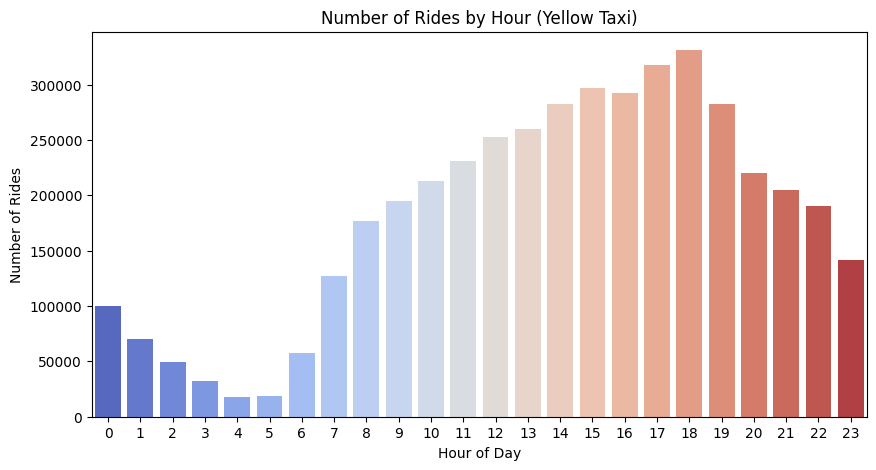

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:320: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




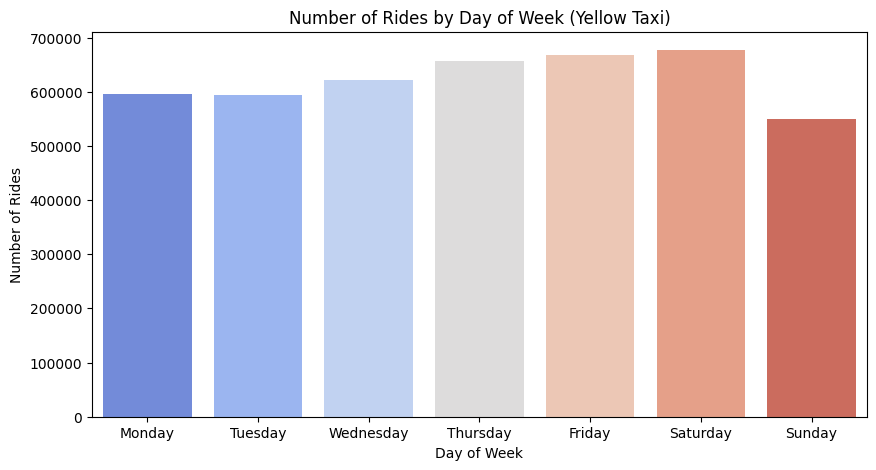

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:334: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




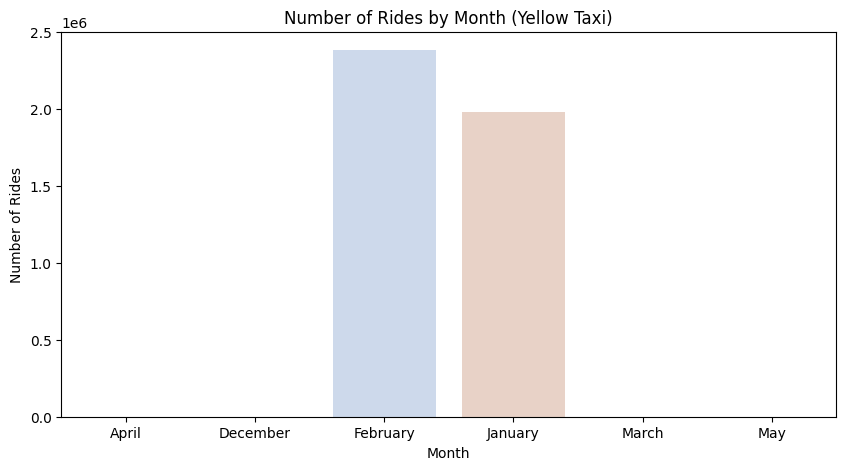

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:342: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




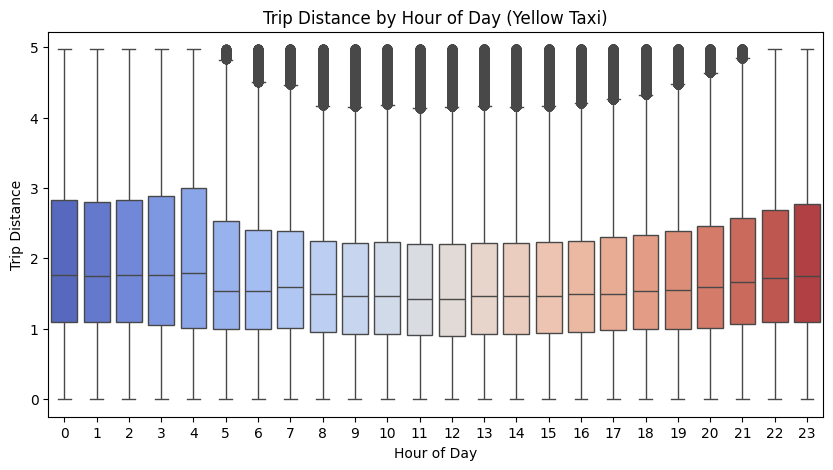

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:350: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




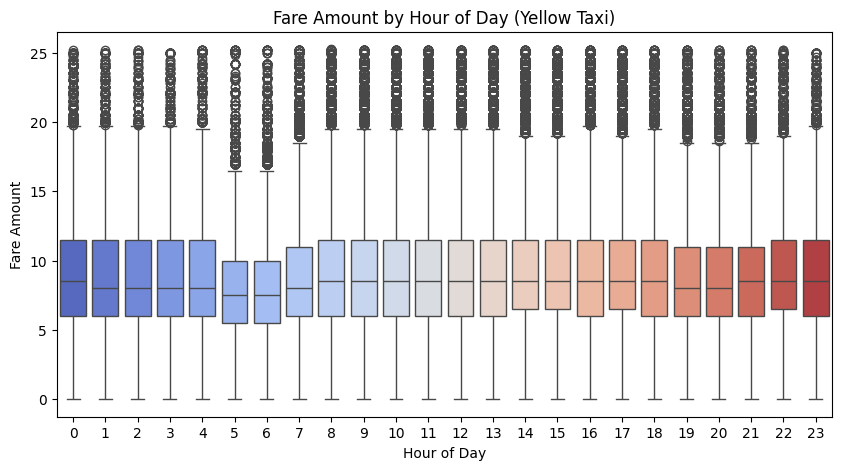

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:311: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




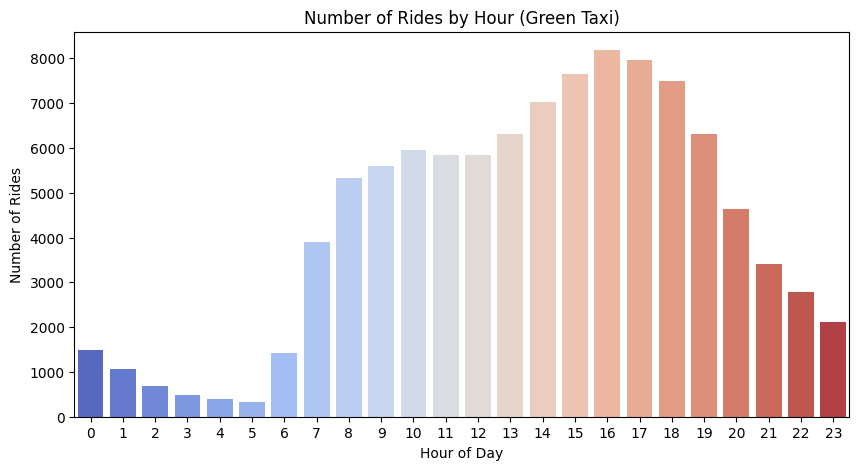

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:320: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




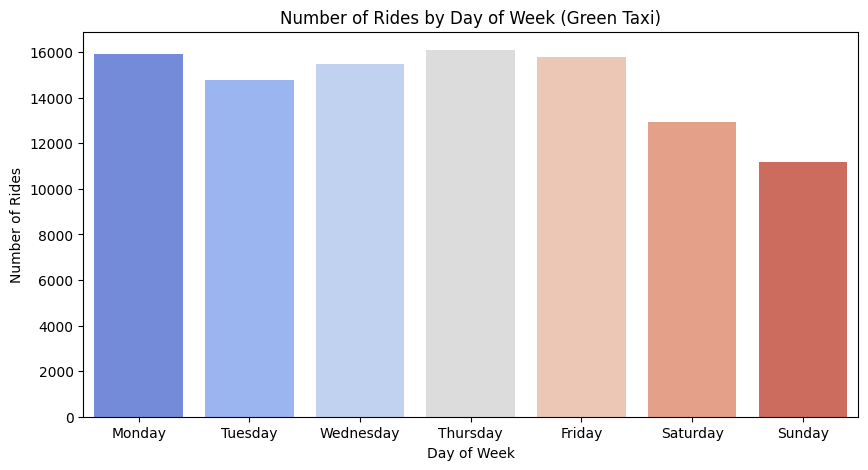

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:334: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




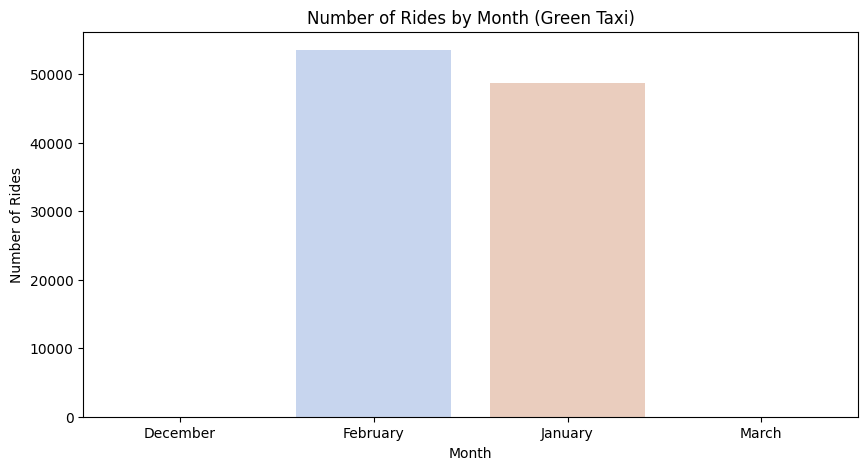

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:342: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




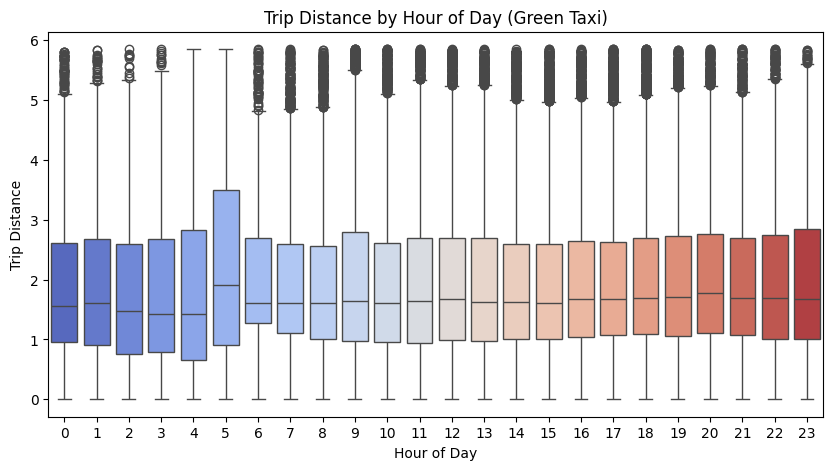

c:\Users\alber\Desktop\DTU\Data Visualization and Analysis\62444-Project-Course-main\src\helper_functions.py:350: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




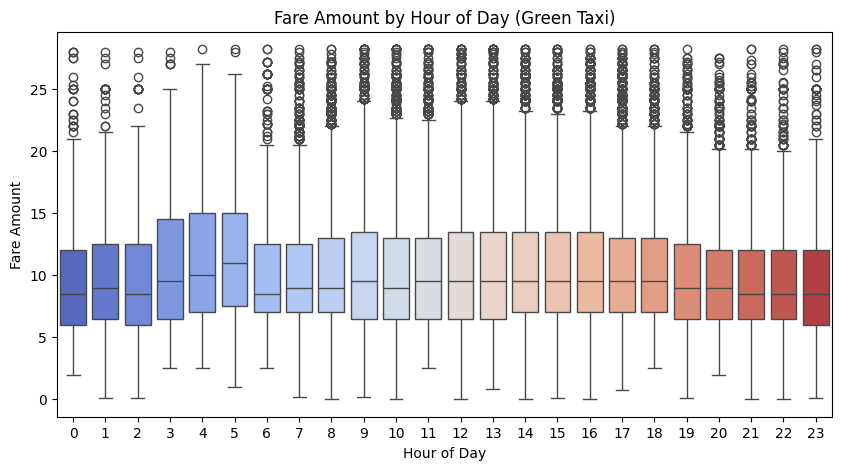

In [90]:
# Write your code and markdowns

from src.helper_functions import analyze_temporal_patterns

# Analyze Yellow Taxi Data
analyze_temporal_patterns(df_yellow_cleaned, taxi_type="Yellow")

# Analyze Green Taxi Data
analyze_temporal_patterns(df_green_cleaned, taxi_type="Green")

**Textbook Practice**: Use the principle "clutter is your enemy" to simplify your plots/graphs properly. Explain your motivation for each plot.

Bar Plots:
Bar plots effectively display the number of rides across discrete time categories, such as by hour, day of the week, or month. They are particularly useful for comparing aggregated counts, making it easy to identify temporal patterns. For example, they highlight peak hours during the day, differences in ride activity between weekdays and weekends, and seasonal trends across months. The simplicity of bar plots ensures that trends are quickly understood without unnecessary distractions.

Box Plots:
Box plots are ideal for analyzing the variability of continuous variables like trip distance and fare amount across hours of the day. They summarize key statistics, including medians, quartiles, and outliers, in a compact and visually intuitive format. This makes it easy to identify patterns, such as whether longer trips or higher fares are more common during specific times (e.g., late at night or early morning). Unlike scatter plots, which can be cluttered with overlapping data points, box plots maintain clarity while conveying meaningful insights.

Palette Choice:
The coolwarm palette was chosen for its perceptual uniformity and accessibility, making the visualizations both aesthetically pleasing and interpretable by colorblind users. The gradient transitions smoothly from cool (blue) to warm (red), clearly distinguishing low and high values. This palette also aligns with natural associations—for example, early hours when the sun is down are represented in blue, while warmer tones like red correspond to midday or busier times. Similarly, Monday being blue and Sunday being red creates a visually intuitive and cohesive design. By emphasizing the magnitude of patterns in ride counts, trip distances, and fares, the palette enhances readability without overwhelming the viewer.

### Task 5: Time-Series Forecasting
Use Prophet or a similar tool to forecast the number of taxi rides in the future, respectively for green and yellow taxis. This includes creating a time-series model, tuning its parameters, and validating its performance. Also, interpret the model's predictions and identify the factors driving the forecasted trends.

A good example for using Prophet to do time-series forecasting can be found here https://www.kaggle.com/code/prashant111/tutorial-time-series-forecasting-with-prophet

**Modeling Details**:
Conduct parameter tuning for the forecasting model. Use cross-validation techniques appropriate for time series data, like time-based splitting.

**Evaluation Metrics**:
Specify which metrics will be used to evaluate the forecasting model, such as MAE (Mean Absolute Error), RMSE (Root Mean Square Error), or MAPE (Mean Absolute Percentage Error). Explain why these metrics are suitable (or not suitable) for the task.

**Visualization and Textbook Practice**: Plotting the forecasts against actual values to visually assess the model's performance. Creating a plot that shows how the forecast and confidence intervals change over time. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention shere you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Hint**: In order to evaluate how your model performs, you need to split the dataset to be train and test. For time-series data, we cannot randomly select the data record (i.e. the rows) to be in train or test. Namely, all training data must be before the earliest test data. In other words, the model is always trained on historical data and then used to forecast the future.

### Import libraries

In [92]:
import plotly
import plotly.graph_objects as go
from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error
from prophet.diagnostics import cross_validation, performance_metrics
from itertools import product



# Monkey-patch Prophet to include 'go'
import prophet.plot
prophet.plot.go = go

### Initialize plotly and preprocessing

In [93]:
# Initialize Plotly for Jupyter Notebook
py.init_notebook_mode()


# Ensure `tpep_pickup_datetime` is in datetime format
df_yellow_cleaned['tpep_pickup_datetime'] = pd.to_datetime(df_yellow_cleaned['tpep_pickup_datetime'])

# Filter data for dates between January 1, 2022, and February 28, 2022 (There were outliers through the year)
df_yellow_cleaned = df_yellow_cleaned[
    (df_yellow_cleaned['tpep_pickup_datetime'] >= '2022-01-01') &
    (df_yellow_cleaned['tpep_pickup_datetime'] <= '2022-02-28')
]

# Extract date and count rides
rides_per_day = (
    df_yellow_cleaned
    .groupby(df_yellow_cleaned['tpep_pickup_datetime'].dt.date)
    .size()
    .reset_index(name='ride_count')
)

# Rename columns for Prophet
rides_per_day.rename(columns={'tpep_pickup_datetime': 'ds', 'ride_count': 'y'}, inplace=True)
rides_per_day['ds'] = pd.to_datetime(rides_per_day['ds'])  # Ensure `ds` is datetime

# Debugging: Print the first few rows of `rides_per_day`
print(rides_per_day.head())


          ds      y
0 2022-01-01  47095
1 2022-01-02  41733
2 2022-01-03  54921
3 2022-01-04  58523
4 2022-01-05  59338


### Train test split

In [94]:
# Split the data into training and testing sets
split_date = '2022-02-15'  # Example: Use data before this date for training
train_data = rides_per_day[rides_per_day['ds'] < split_date]
test_data = rides_per_day[rides_per_day['ds'] >= split_date]

### Define grid parameters

In [95]:
#seasonality_modes = ['additive', 'multiplicative'] #kolla vilken som e bäst här 
seasonality_modes = ['multiplicative']
fourier_orders = [11, 12]
#growth_models = ['linear', 'logistic'] #Kolla vilken som e bäst här (linear bäst)
growth_models = ['linear']

changepoint_scales = [0.000625, 0.00125]       # Variation in how flexible the trend can be
seasonality_scales = [12.0, 12.5]       # Variation in how strong seasonal effects can be
n_changepoints_list = [7, 8, 9]          # Possible numbers of changepoints

# Create list of all parameter combos
param_grid = list(product(
    seasonality_modes, 
    fourier_orders, 
    growth_models, 
    changepoint_scales, 
    seasonality_scales, 
    n_changepoints_list
))

# fourier_order': 10, 'growth': 'linear', 'changepoint_prior_scale': 0.0025, 'seasonality_prior_scale': 12.0, 'n_changepoints': 8,  7085
# 'seasonality_mode': 'multiplicative', 'fourier_order': 10, 'growth': 'linear', 'changepoint_prior_scale': 0.00125, 'seasonality_prior_scale': 12.0, 'n_changepoints': 8, 'avg_rmse': np.float64(7080.525733445043)}

### Parameter tuning

In [96]:
# We'll store the results here
results = []

# Precompute a capacity value just in case we use logistic growth
max_y = train_data['y'].max()
capacity_value = max_y * 1.2  # 20% higher than the max value

results = []
for (mode, fourier, growth, cps, seas_ps, n_changepoints) in param_grid:
    print(f"Testing: mode={mode}, fourier_order={fourier}, growth={growth}, "
          f"changepoint_prior_scale={cps}, seasonality_prior_scale={seas_ps}, "
          f"n_changepoints={n_changepoints}")
    
    # Copy train_data for manipulation
    temp_train = train_data.copy()
    
    # If using logistic growth, add 'cap' column
    if growth == 'logistic':
        temp_train['cap'] = capacity_value
    
    # Initialize Prophet model with the current combination
    model = Prophet(
        seasonality_mode=mode,
        growth=growth,
        interval_width=0.95,
        changepoint_prior_scale=cps,
        seasonality_prior_scale=seas_ps,
        n_changepoints=n_changepoints
    )
    # Add weekly seasonality with the desired Fourier order
    model.add_seasonality(name='weekly', period=7, fourier_order=fourier)
    
    # Fit the model on temp_train
    model.fit(temp_train)
    
    df_cv = cross_validation(
        model, 
        initial='30 days',
        period='7 days',
        horizon='7 days'
    )
    
    # Performance metrics from cross-validation
    df_p = performance_metrics(df_cv)
    avg_rmse = df_p['rmse'].mean()
    
    # Store results
    results.append({
        'seasonality_mode': mode,
        'fourier_order': fourier,
        'growth': growth,
        'changepoint_prior_scale': cps,
        'seasonality_prior_scale': seas_ps,
        'n_changepoints': n_changepoints,
        'avg_rmse': avg_rmse
    })

# 8. Pick Best Parameters (lowest RMSE)
results_sorted = sorted(results, key=lambda x: x['avg_rmse'])
best_params = results_sorted[0]

print("\n--- Best Parameters Based on Cross-Validation ---")
print(best_params)

20:43:09 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=7


20:43:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:10 - cmdstanpy - INFO - Chain [1] start processing
20:43:10 - cmdstanpy - INFO - Chain [1] done processing
20:43:10 - cmdstanpy - INFO - Chain [1] start processing
20:43:10 - cmdstanpy - INFO - Chain [1] done processing
20:43:10 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=8


20:43:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:11 - cmdstanpy - INFO - Chain [1] start processing
20:43:11 - cmdstanpy - INFO - Chain [1] done processing
20:43:11 - cmdstanpy - INFO - Chain [1] start processing
20:43:11 - cmdstanpy - INFO - Chain [1] done processing
20:43:12 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=9


20:43:12 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:12 - cmdstanpy - INFO - Chain [1] start processing
20:43:12 - cmdstanpy - INFO - Chain [1] done processing
20:43:12 - cmdstanpy - INFO - Chain [1] start processing
20:43:12 - cmdstanpy - INFO - Chain [1] done processing
20:43:12 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=7


20:43:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:13 - cmdstanpy - INFO - Chain [1] start processing
20:43:13 - cmdstanpy - INFO - Chain [1] done processing
20:43:13 - cmdstanpy - INFO - Chain [1] start processing
20:43:13 - cmdstanpy - INFO - Chain [1] done processing
20:43:13 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=8


20:43:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:14 - cmdstanpy - INFO - Chain [1] done processing
20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:14 - cmdstanpy - INFO - Chain [1] done processing
20:43:15 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=9


20:43:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:15 - cmdstanpy - INFO - Chain [1] start processing
20:43:15 - cmdstanpy - INFO - Chain [1] done processing
20:43:15 - cmdstanpy - INFO - Chain [1] start processing
20:43:15 - cmdstanpy - INFO - Chain [1] done processing
20:43:16 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=7


20:43:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:16 - cmdstanpy - INFO - Chain [1] start processing
20:43:16 - cmdstanpy - INFO - Chain [1] done processing
20:43:16 - cmdstanpy - INFO - Chain [1] start processing
20:43:17 - cmdstanpy - INFO - Chain [1] done processing
20:43:17 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=8


20:43:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:17 - cmdstanpy - INFO - Chain [1] start processing
20:43:17 - cmdstanpy - INFO - Chain [1] done processing
20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing
20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=9


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing
20:43:18 - cmdstanpy - INFO - Chain [1] start processing
20:43:18 - cmdstanpy - INFO - Chain [1] done processing
20:43:19 - cmdstanpy - INFO - Chain [1] start processing
20:43:19 - cmdstanpy - INFO - Chain [1] done processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=7


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:19 - cmdstanpy - INFO - Chain [1] start processing
20:43:19 - cmdstanpy - INFO - Chain [1] done processing
20:43:19 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1] done processing
20:43:20 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=8


20:43:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:20 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1] done processing
20:43:20 - cmdstanpy - INFO - Chain [1] start processing
20:43:20 - cmdstanpy - INFO - Chain [1] done processing
20:43:21 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=11, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=9


20:43:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:21 - cmdstanpy - INFO - Chain [1] start processing
20:43:21 - cmdstanpy - INFO - Chain [1] done processing
20:43:21 - cmdstanpy - INFO - Chain [1] start processing
20:43:21 - cmdstanpy - INFO - Chain [1] done processing
20:43:22 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=7


20:43:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:22 - cmdstanpy - INFO - Chain [1] start processing
20:43:22 - cmdstanpy - INFO - Chain [1] done processing
20:43:22 - cmdstanpy - INFO - Chain [1] start processing
20:43:22 - cmdstanpy - INFO - Chain [1] done processing
20:43:23 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=8


20:43:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:23 - cmdstanpy - INFO - Chain [1] start processing
20:43:23 - cmdstanpy - INFO - Chain [1] done processing
20:43:23 - cmdstanpy - INFO - Chain [1] start processing
20:43:24 - cmdstanpy - INFO - Chain [1] done processing
20:43:25 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.0, n_changepoints=9


20:43:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:26 - cmdstanpy - INFO - Chain [1] start processing
20:43:26 - cmdstanpy - INFO - Chain [1] done processing
20:43:26 - cmdstanpy - INFO - Chain [1] start processing
20:43:26 - cmdstanpy - INFO - Chain [1] done processing
20:43:27 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=7


20:43:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:27 - cmdstanpy - INFO - Chain [1] start processing
20:43:27 - cmdstanpy - INFO - Chain [1] done processing
20:43:27 - cmdstanpy - INFO - Chain [1] start processing
20:43:28 - cmdstanpy - INFO - Chain [1] done processing
20:43:28 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=8


20:43:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:28 - cmdstanpy - INFO - Chain [1] start processing
20:43:29 - cmdstanpy - INFO - Chain [1] done processing
20:43:29 - cmdstanpy - INFO - Chain [1] start processing
20:43:29 - cmdstanpy - INFO - Chain [1] done processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.000625, seasonality_prior_scale=12.5, n_changepoints=9


20:43:29 - cmdstanpy - INFO - Chain [1] start processing
20:43:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:30 - cmdstanpy - INFO - Chain [1] done processing
20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:31 - cmdstanpy - INFO - Chain [1] done processing
20:43:31 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=7


20:43:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:32 - cmdstanpy - INFO - Chain [1] start processing
20:43:32 - cmdstanpy - INFO - Chain [1] done processing
20:43:32 - cmdstanpy - INFO - Chain [1] start processing
20:43:33 - cmdstanpy - INFO - Chain [1] done processing
20:43:33 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=8


20:43:34 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:35 - cmdstanpy - INFO - Chain [1] start processing
20:43:35 - cmdstanpy - INFO - Chain [1] done processing
20:43:35 - cmdstanpy - INFO - Chain [1] start processing
20:43:35 - cmdstanpy - INFO - Chain [1] done processing
20:43:36 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.0, n_changepoints=9


20:43:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:36 - cmdstanpy - INFO - Chain [1] start processing
20:43:37 - cmdstanpy - INFO - Chain [1] done processing
20:43:37 - cmdstanpy - INFO - Chain [1] start processing
20:43:37 - cmdstanpy - INFO - Chain [1] done processing
20:43:37 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=7


20:43:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:38 - cmdstanpy - INFO - Chain [1] start processing
20:43:38 - cmdstanpy - INFO - Chain [1] done processing
20:43:38 - cmdstanpy - INFO - Chain [1] start processing
20:43:38 - cmdstanpy - INFO - Chain [1] done processing
20:43:39 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=8


20:43:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:39 - cmdstanpy - INFO - Chain [1] start processing
20:43:39 - cmdstanpy - INFO - Chain [1] done processing
20:43:39 - cmdstanpy - INFO - Chain [1] start processing
20:43:40 - cmdstanpy - INFO - Chain [1] done processing
20:43:40 - cmdstanpy - INFO - Chain [1] start processing


Testing: mode=multiplicative, fourier_order=12, growth=linear, changepoint_prior_scale=0.00125, seasonality_prior_scale=12.5, n_changepoints=9


20:43:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

20:43:40 - cmdstanpy - INFO - Chain [1] start processing
20:43:40 - cmdstanpy - INFO - Chain [1] done processing
20:43:41 - cmdstanpy - INFO - Chain [1] start processing
20:43:41 - cmdstanpy - INFO - Chain [1] done processing



--- Best Parameters Based on Cross-Validation ---
{'seasonality_mode': 'multiplicative', 'fourier_order': 11, 'growth': 'linear', 'changepoint_prior_scale': 0.000625, 'seasonality_prior_scale': 12.5, 'n_changepoints': 7, 'avg_rmse': np.float64(7073.466738988101)}


### Initialize and fit model

In [97]:
# Extract best param values 
best_mode = best_params['seasonality_mode']
best_fourier = best_params['fourier_order']
best_growth = best_params['growth']
best_cps = best_params['changepoint_prior_scale']
best_seas_ps = best_params['seasonality_prior_scale']
best_ncp = best_params['n_changepoints']

# Copy train_data to add 'cap' if logistic
final_train_data = train_data.copy()
if best_growth == 'logistic':
    final_train_data['cap'] = capacity_value

# Initialize final Prophet model
best_model = Prophet(
    seasonality_mode=best_mode,
    growth=best_growth,
    changepoint_prior_scale=best_cps,
    seasonality_prior_scale=best_seas_ps,
    n_changepoints=best_ncp,
    interval_width=0.95
)

best_model.add_seasonality(name='weekly', period=7, fourier_order=best_fourier)
best_model.fit(final_train_data)

print("\n--- Best Parameters Based on Cross-Validation ---")
print(best_params)

20:43:42 - cmdstanpy - INFO - Chain [1] start processing
20:43:42 - cmdstanpy - INFO - Chain [1] done processing



--- Best Parameters Based on Cross-Validation ---
{'seasonality_mode': 'multiplicative', 'fourier_order': 11, 'growth': 'linear', 'changepoint_prior_scale': 0.000625, 'seasonality_prior_scale': 12.5, 'n_changepoints': 7, 'avg_rmse': np.float64(7073.466738988101)}


### Make forecast

In [98]:
# Extend the future DataFrame to include the test period and additional future dates
future = best_model.make_future_dataframe(periods=len(test_data) + 30)

# If using logistic growth, add 'cap' column to future
if growth == 'logistic':
    future['cap'] = capacity_value

forecast = best_model.predict(future)

# Debugging: Print the forecast DataFrame
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())

          ds          yhat    yhat_lower    yhat_upper
0 2022-01-01  53304.862961  35038.351442  72308.065364
1 2022-01-02  44542.612933  25488.015283  62562.544717
2 2022-01-03  50088.869148  29674.342883  68485.509236
3 2022-01-04  56575.018219  37866.666686  76726.144559
4 2022-01-05  58955.471706  40365.498258  77417.576541


### Evaluate model

In [99]:
# Evaluate the model using the test data
forecast_test = forecast[['ds', 'yhat']].merge(test_data, on='ds', how='inner')

mae = mean_absolute_error(forecast_test['y'], forecast_test['yhat'])
rmse = np.sqrt(mean_squared_error(forecast_test['y'], forecast_test['yhat']))

print(f"Mean Absolute Error (MAE) on Test Data: {mae}")
print(f"Root Mean Square Error (RMSE) on Test Data: {rmse}")


Mean Absolute Error (MAE) on Test Data: 6534.183929245401
Root Mean Square Error (RMSE) on Test Data: 8345.436027357206


### Plots

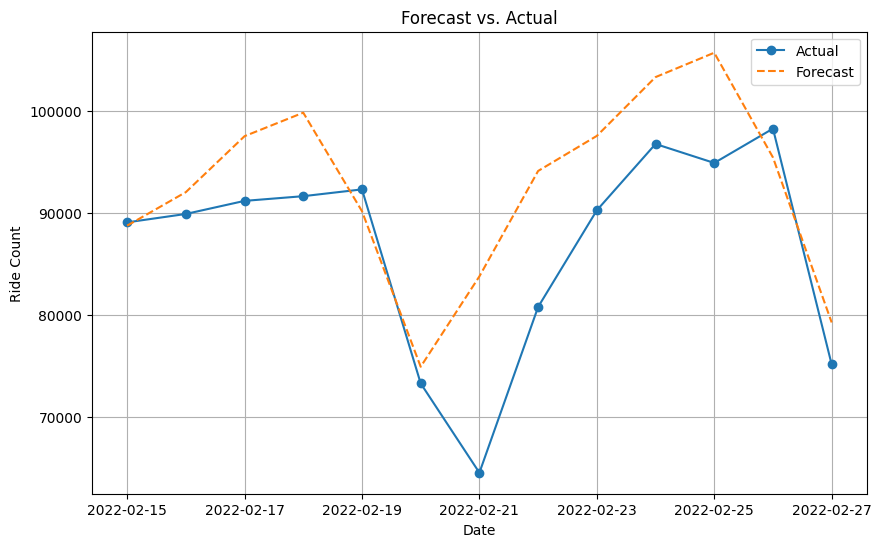

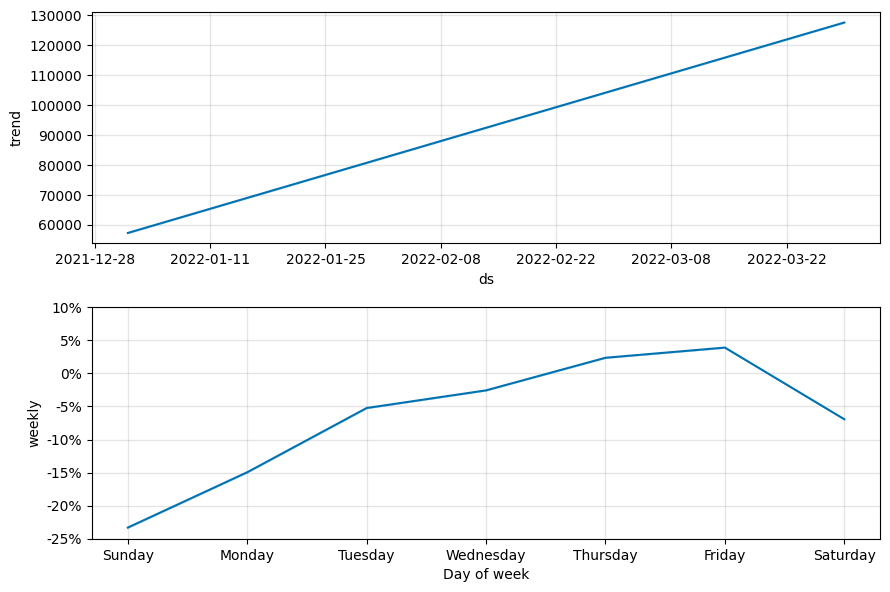

In [100]:
plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], test_data['y'], label='Actual', marker='o')
plt.plot(forecast_test['ds'], forecast_test['yhat'], label='Forecast', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Ride Count')
plt.title('Forecast vs. Actual')
plt.legend()
plt.grid()
plt.show()

fig = plot_plotly(best_model, forecast)
fig.show()

best_model.plot_components(forecast)
plt.show()